In [1]:
%matplotlib inline
import pylab as pl
pl.style.use('dark_background')
pl.rcParams['font.size'] = 16

In [78]:
import copy

In [4]:
from spectral_cube import SpectralCube

In [5]:
import sys
sys.path.append('/orange/adamginsburg/ALMA_IMF/reduction/analysis/')
from spectralindex import prefixes

In [72]:
import os
os.chdir('/orange/adamginsburg/ALMA_IMF/May2021Release/')

prefixes['W43MM1'] = dict(
    finaliter_prefix_b3="W43-MM1/B3/cleanest/W43-MM1_B3_uid___A001_X1296_X1af_continuum_merged_12M_robust0_selfcal4_finaliter",
    finaliter_prefix_b6="W43-MM2/B6/cleanest/W43-MM2_B6_uid___A001_X1296_X113_continuum_merged_12M_robust0_selfcal5_finaliter",)

wcses = {fieldid: SpectralCube.read(pfxs['finaliter_prefix_b3']+".image.tt0.fits", format='fits', use_dask=False).wcs.celestial
         for fieldid, pfxs in prefixes.items()}
shapes = {fieldid: SpectralCube.read(pfxs['finaliter_prefix_b3']+".image.tt0.fits", format='fits', use_dask=False).shape[1:]
                   for fieldid, pfxs in prefixes.items()}


In [11]:
shapes

{'G328': (3000, 3360),
 'G333': (3000, 3920),
 'G12': (960, 960),
 'W51IRS2': (3840, 3840),
 'G008': (2520, 3150),
 'G327': (2560, 3360),
 'G10': (2688, 2688),
 'G337': (2560, 3136),
 'G338': (2916, 2916),
 'G351': (896, 1050),
 'G353': (896, 1050),
 'W43MM3': (3000, 3360),
 'W43MM2': (4200, 4704),
 'W43MM1': (3360, 3360),
 'W51-E': (4800, 4800)}

In [51]:
import json
import tqdm.notebook
import warnings
from astropy.io import fits
from astropy import wcs, coordinates
from astropy.utils.exceptions import AstropyWarning
from astropy import units as u

# https://github.com/astropy/astropy/issues/299#issuecomment-946169486
def trywcs(header):
    try:
        return wcs.WCS(header)
    except wcs.InvalidTransformError:
        if header['CTYPE1'] == 'RA---TAN':
            header['CTYPE1'] = 'RA---TPV'
            header['CTYPE2'] = 'DEC--TPV'
            return wcs.WCS(header)
        else:
            raise

basepath = '/orange/adamginsburg/downloads/UWIFE/'

position_map_fn = f'{basepath}/position_map.json'
if os.path.exists(position_map_fn):
    with open(position_map_fn, 'r') as fh:
        coord_dict = json.load(fh)
    filename_dict = {key: {k2: coordinates.SkyCoord(ra*u.deg, dec*u.deg, frame='fk5') for k2,(ra,dec) in coord_dict[key].items()} for key in coord_dict}
else:
    filename_dict = {}
    for filtername in filters:
        filelist = glob.glob(f'{basepath}/uwife*_{filtername}*_starsub.fits')
        field_centers = {}
        filename_dict[filtername] = field_centers
        for fn in tqdm.notebook.tqdm(filelist):
            with warnings.catch_warnings():
                warnings.simplefilter('ignore', AstropyWarning)
                fh = fits.open(fn)
                ww = trywcs(fh[0].header)
                center = coordinates.SkyCoord(
                        *ww.wcs_pix2world(
                            fh[0].data.shape[1]/2, fh[0].data.shape[0]/2, 0),
                            frame=ww.wcs.radesys.lower(), unit=(u.deg, u.deg))
                field_centers[fn] = center
    coord_dict = {key: {k2:(val.ra.deg, val.dec.deg) for k2, val in filename_dict[key].items()} for key in filename_dict}
    with open(position_map_fn, 'w') as fh:
        json.dump(coord_dict, fh)

Reading files for field G328


  0%|          | 0/3136 [00:00<?, ?it/s]

Skipped H2
Reading files for field G333


  0%|          | 0/3136 [00:00<?, ?it/s]

Skipped H2
Reading files for field G12


  0%|          | 0/3136 [00:00<?, ?it/s]

Reprojecting 29 hdus to (960, 960)
Reading files for field W51IRS2


  0%|          | 0/3136 [00:00<?, ?it/s]

Reprojecting 17 hdus to (3840, 3840)
Reading files for field G008


  0%|          | 0/3136 [00:00<?, ?it/s]

Reprojecting 9 hdus to (2520, 3150)
Reading files for field G327


  0%|          | 0/3136 [00:00<?, ?it/s]

Skipped H2
Reading files for field G10


  0%|          | 0/3136 [00:00<?, ?it/s]

Reprojecting 24 hdus to (2688, 2688)
Reading files for field G337


  0%|          | 0/3136 [00:00<?, ?it/s]

Skipped H2
Reading files for field G338


  0%|          | 0/3136 [00:00<?, ?it/s]

Skipped H2
Reading files for field G351


  0%|          | 0/3136 [00:00<?, ?it/s]

Skipped H2
Reading files for field G353


  0%|          | 0/3136 [00:00<?, ?it/s]

Skipped H2
Reading files for field W43MM3


  0%|          | 0/3136 [00:00<?, ?it/s]

Reprojecting 31 hdus to (3000, 3360)
Reading files for field W43MM2


  0%|          | 0/3136 [00:00<?, ?it/s]

Reprojecting 31 hdus to (4200, 4704)
Reading files for field W43MM1


  0%|          | 0/3136 [00:00<?, ?it/s]

Reprojecting 36 hdus to (3360, 3360)
Reading files for field W51-E


  0%|          | 0/3136 [00:00<?, ?it/s]

Reprojecting 16 hdus to (4800, 4800)
Reading files for field G328


  0%|          | 0/3514 [00:00<?, ?it/s]

Skipped FeII
Reading files for field G333


  0%|          | 0/3514 [00:00<?, ?it/s]

Skipped FeII
Reading files for field G12


  0%|          | 0/3514 [00:00<?, ?it/s]

Reprojecting 29 hdus to (960, 960)
Reading files for field W51IRS2


  0%|          | 0/3514 [00:00<?, ?it/s]

Reprojecting 17 hdus to (3840, 3840)
Reading files for field G008


  0%|          | 0/3514 [00:00<?, ?it/s]

Reprojecting 9 hdus to (2520, 3150)
Reading files for field G327


  0%|          | 0/3514 [00:00<?, ?it/s]

Skipped FeII
Reading files for field G10


  0%|          | 0/3514 [00:00<?, ?it/s]

Reprojecting 25 hdus to (2688, 2688)
Reading files for field G337


  0%|          | 0/3514 [00:00<?, ?it/s]

Skipped FeII
Reading files for field G338


  0%|          | 0/3514 [00:00<?, ?it/s]

Skipped FeII
Reading files for field G351


  0%|          | 0/3514 [00:00<?, ?it/s]

Skipped FeII
Reading files for field G353


  0%|          | 0/3514 [00:00<?, ?it/s]

Skipped FeII
Reading files for field W43MM3


  0%|          | 0/3514 [00:00<?, ?it/s]

Reprojecting 31 hdus to (3000, 3360)
Reading files for field W43MM2


  0%|          | 0/3514 [00:00<?, ?it/s]

Reprojecting 31 hdus to (4200, 4704)
Reading files for field W43MM1


  0%|          | 0/3514 [00:00<?, ?it/s]

Reprojecting 36 hdus to (3360, 3360)
Reading files for field W51-E


  0%|          | 0/3514 [00:00<?, ?it/s]

Reprojecting 16 hdus to (4800, 4800)


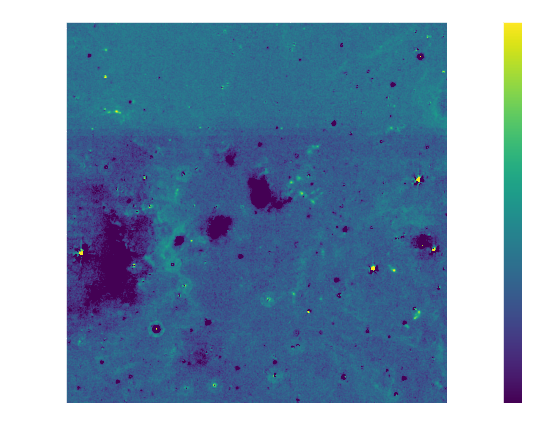

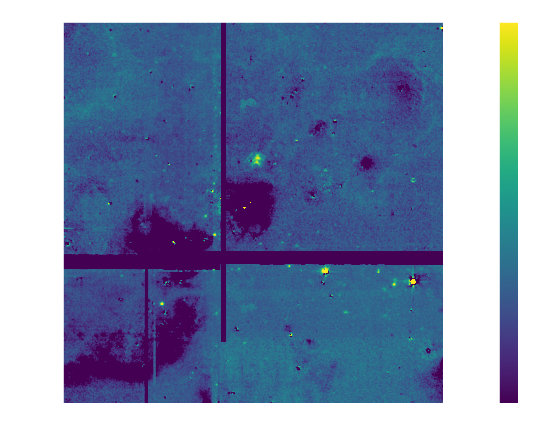

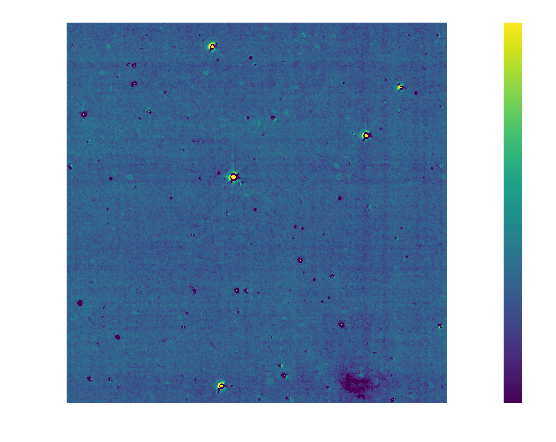

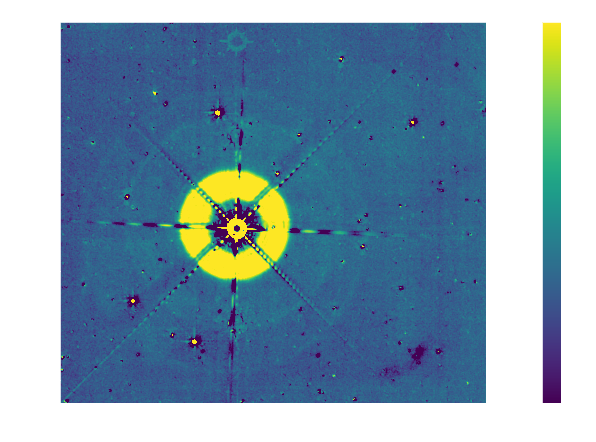

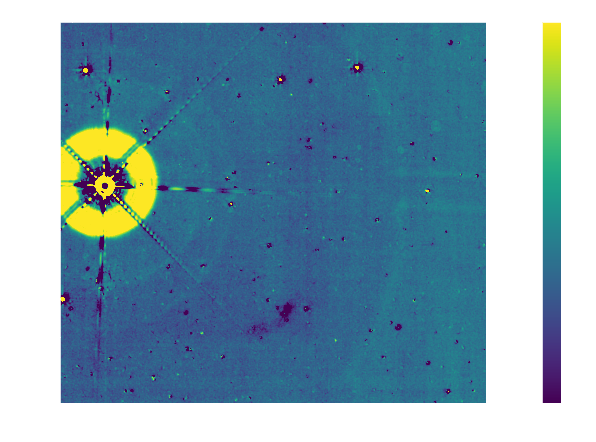

...

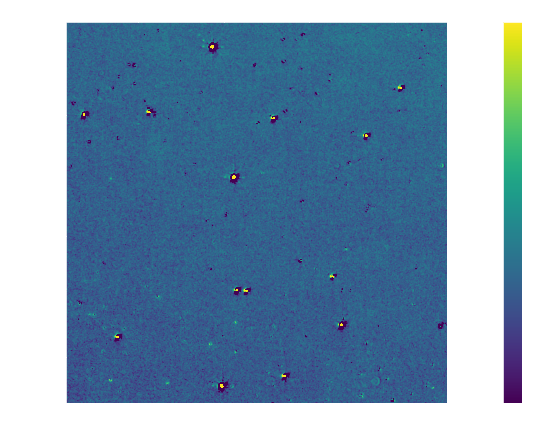

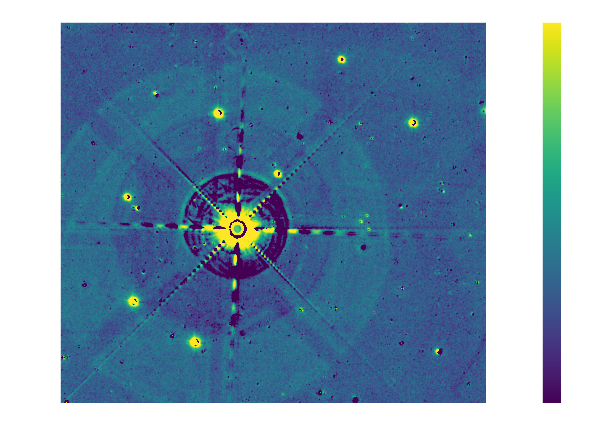

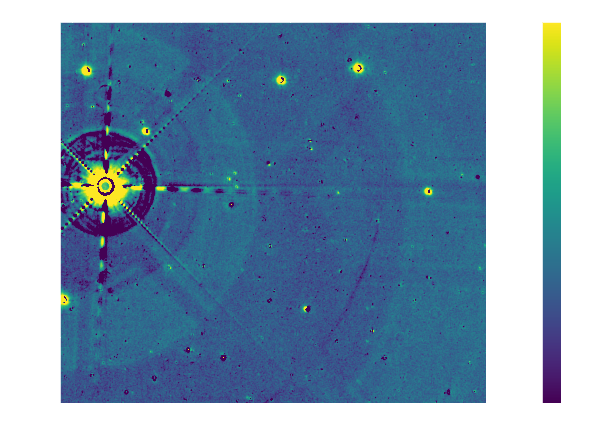

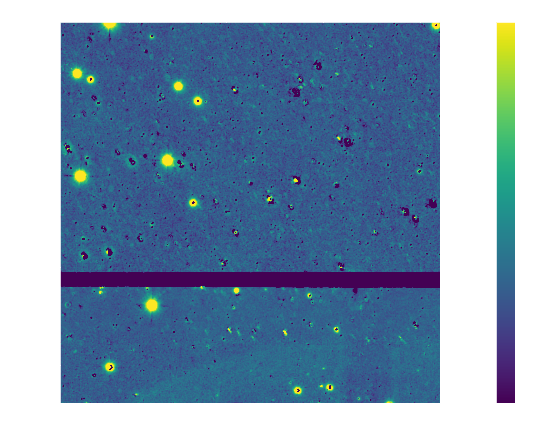

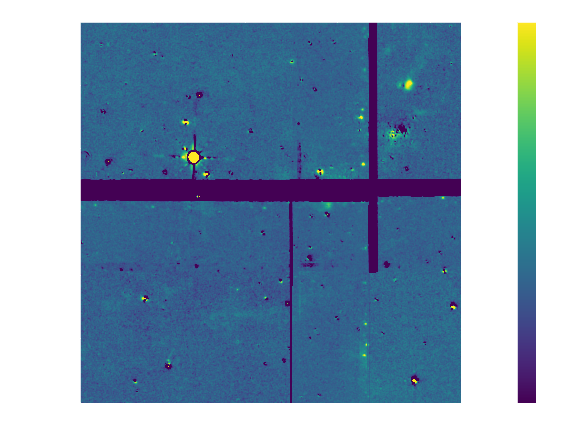

In [104]:
import reproject
from astropy import units as u
from astropy.io import fits
from astropy import coordinates
from astropy import wcs
import warnings
from astropy.utils.exceptions import AstropyWarning
from reproject import reproject_interp
from reproject.mosaicking import find_optimal_celestial_wcs, reproject_and_coadd
import tqdm
import tqdm.notebook

basepath = '/orange/adamginsburg/downloads/UWIFE/'
# RA = 18:18:13.6803
# DEC = -16:57:46.791


filters = ('H2', 'FeII')

import glob

if __name__ == "__main__": 
    
    for filtername in filters:
        for field,target_wcs in wcses.items():

            filelist = glob.glob(f'{basepath}/uwife*_{filtername}*_starsub.fits')

            target_wcs_bigger = target_wcs.copy()
            target_wcs_bigger.wcs = copy.copy(target_wcs.wcs)
            target_wcs_bigger._naxis = shapes[field][0]*20, shapes[field][1]*20
            target_wcs_bigger.wcs.crpix = target_wcs_bigger.wcs.crpix * 20
            
            def read_as_2d(fn):
                fh = fits.open(fn)
                fh[0].data = fh[0].data.squeeze()
                ww = trywcs(fh[0].header).celestial
                fh[0].header = ww.to_header()
                return fh

            print(f"Reading files for field {field}")
            hdus = []
            for fn in tqdm.notebook.tqdm(filelist):
                if target_wcs_bigger.footprint_contains(filename_dict[filtername][fn]):
                    hdus.append(read_as_2d(fn))

            if len(hdus)>0:
                #target_wcs, shape_out = find_optimal_celestial_wcs(hdus, frame='galactic')
                shape_out = shapes[field]
                
                # make sure we're not using the oversized version
                assert not np.all(target_wcs.wcs.crpix == target_wcs_bigger.wcs.crpix)

                print(f"Reprojecting {len(hdus)} hdus to {shape_out}")
                array, footprint = reproject_and_coadd(hdus,
                                                       target_wcs, shape_out=shape_out,
                                                       reproject_function=reproject_interp)
                
                assert array.shape == shape_out

                fits.PrimaryHDU(data=array, header=target_wcs.to_header()).writeto(f'{basepath}/mosaics/{field}_{filtername}_mosaic.fits', overwrite=True)

                if np.any(array>0):
                    import pylab as pl
                    from astropy import visualization
                    pl.matplotlib.use('agg')
                    fig = pl.figure(figsize=(20,7))
                    ax = fig.add_subplot(111, projection=target_wcs)
                    im = ax.imshow(array, norm=visualization.simple_norm(array, stretch='asinh', min_cut=-50, max_cut=400))
                    pl.colorbar(mappable=im)
                    ax.coords[0].set_axislabel('RA')
                    ax.coords[1].set_axislabel('Dec')
                    #ax.coords[0].set_major_formatter('d.dd')
                    #ax.coords[1].set_major_formatter('d.dd')
                    #ax.coords[0].set_ticks(spacing=0.1*u.deg)
                    #ax.coords[0].set_ticklabel(rotation=45, pad=20)
                    ax.set_title(f"{field} {filtername}")

                    fig.savefig(f'{basepath}/mosaics/{field}_{filtername}_mosaic.png', bbox_inches='tight')
            else:
                print(f"Skipped {filtername}")


In [55]:
%matplotlib inline
import pylab as pl

In [56]:
h2_coords = coordinates.SkyCoord([val for k,val in filename_dict['H2'].items()])

In [57]:
for field,target_wcs in wcses.items():
    print(coordinates.SkyCoord(*target_wcs.wcs.crval*u.deg, frame='fk5').galactic)

<SkyCoord (Galactic): (l, b) in deg
    (328.25447923, -0.53143447)>
<SkyCoord (Galactic): (l, b) in deg
    (333.6036162, -0.21241685)>
<SkyCoord (Galactic): (l, b) in deg
    (12.80358705, -0.19936239)>
<SkyCoord (Galactic): (l, b) in deg
    (49.48903434, -0.36910827)>
<SkyCoord (Galactic): (l, b) in deg
    (8.67736225, -0.36059236)>
<SkyCoord (Galactic): (l, b) in deg
    (327.29165321, -0.57876695)>
<SkyCoord (Galactic): (l, b) in deg
    (10.62407455, -0.38407512)>
<SkyCoord (Galactic): (l, b) in deg
    (337.91603312, -0.47705777)>
<SkyCoord (Galactic): (l, b) in deg
    (338.92604269, 0.55394191)>
<SkyCoord (Galactic): (l, b) in deg
    (351.7736039, -0.53737038)>
<SkyCoord (Galactic): (l, b) in deg
    (353.40857897, -0.36136428)>
<SkyCoord (Galactic): (l, b) in deg
    (30.71807868, -0.08214541)>
<SkyCoord (Galactic): (l, b) in deg
    (30.70305606, -0.06715185)>
<SkyCoord (Galactic): (l, b) in deg
    (30.8179862, -0.056851)>
<SkyCoord (Galactic): (l, b) in deg
    (49.4890

G328: 0 <SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    [(239.554236  , -53.99510758), (239.44309734, -53.99510758),
     (239.44317505, -53.93677426), (239.55415828, -53.93677426),
     (239.554236  , -53.99510758)]>
G333: 0 <SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    [(245.59845053, -50.12939371), (245.47954947, -50.12939371),
     (245.47962182, -50.07106039), (245.59837818, -50.07106039),
     (245.59845053, -50.12939371)]>
G12: 9 <SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    [(273.58794595, -17.96043475), (273.52347072, -17.96043475),
     (273.52348188, -17.89910142), (273.58793479, -17.89910142),
     (273.58794595, -17.96043475)]>
W51IRS2: 4 <SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    [(290.94341789, 14.49097054), (290.88833211, 14.49097054),
     (290.88832547, 14.54430387), (290.94342453, 14.54430387),
     (290.94341789, 14.49097054)]>
G008: 0 <SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    [(271.62074631, -21.64528642),

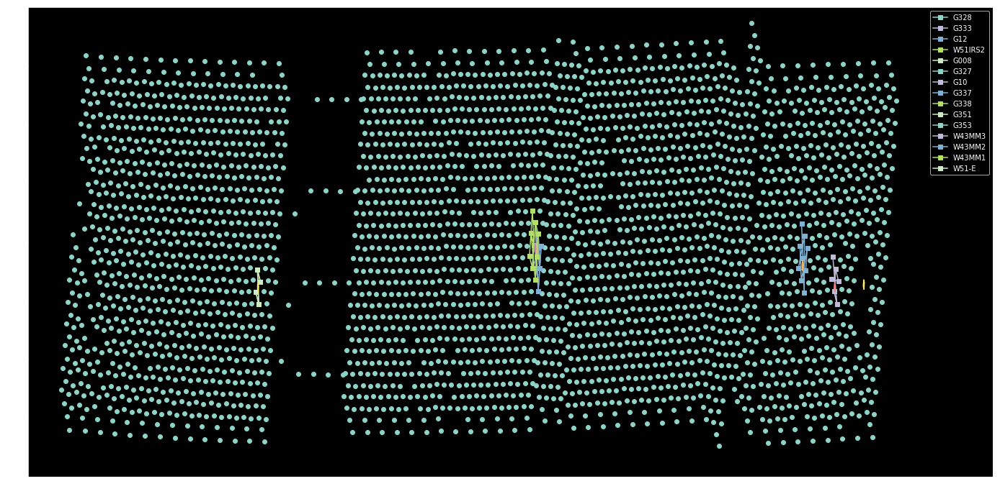

In [79]:
pl.figure(figsize=(24,12))
pl.scatter(h2_coords.galactic.l, h2_coords.galactic.b)

wcses = {fieldid: SpectralCube.read(pfxs['finaliter_prefix_b3']+".image.tt0.fits", format='fits', use_dask=False).wcs.celestial
         for fieldid, pfxs in prefixes.items()}


for field,target_wcs in wcses.items():

    filelist = glob.glob(f'{basepath}/uwife*_{filtername}*_starsub.fits')
    
    yy,xx = shapes[field]
    corners = coordinates.SkyCoord(*target_wcs.wcs_pix2world([0, xx, xx, 0, 0], [0, 0, yy, yy, 0], 0)*u.deg, frame='fk5')

    target_wcs_bigger = target_wcs.copy()
    target_wcs_bigger.wcs = copy.copy(target_wcs.wcs)
    target_wcs_bigger._naxis = shapes[field][0]*10, shapes[field][1]*10
    target_wcs_bigger.wcs.crpix = target_wcs_bigger.wcs.crpix * 10
    
    match = target_wcs_bigger.footprint_contains(h2_coords)
    print(f"{field}: {match.sum()} {corners}")
    pl.plot(h2_coords.galactic.l[match], h2_coords.galactic.b[match], marker='s', label=field)
    pl.plot(corners.galactic.l, corners.galactic.b)

pl.axis((65,0,-2,2))
pl.legend(loc='best')

Skipped field G328 with filter H2.  SiO:True  H2:False
Skipped field G328 with filter FeII.  SiO:True  FeII:False
Skipped field G333 with filter H2.  SiO:True  H2:False
Skipped field G333 with filter FeII.  SiO:True  FeII:False
FOUND files for G12 + H2!
FOUND files for G12 + FeII!
FOUND files for W51IRS2 + H2!
FOUND files for W51IRS2 + FeII!
FOUND files for G008 + H2!
FOUND files for G008 + FeII!
Skipped field G327 with filter H2.  SiO:True  H2:False
Skipped field G327 with filter FeII.  SiO:True  FeII:False
FOUND files for G10 + H2!
FOUND files for G10 + FeII!
Skipped field G337 with filter H2.  SiO:True  H2:False
Skipped field G337 with filter FeII.  SiO:True  FeII:False
Skipped field G338 with filter H2.  SiO:True  H2:False
Skipped field G338 with filter FeII.  SiO:True  FeII:False
Skipped field G351 with filter H2.  SiO:True  H2:False
Skipped field G351 with filter FeII.  SiO:True  FeII:False
Skipped field G353 with filter H2.  SiO:True  H2:False
Skipped field G353 with filter FeII

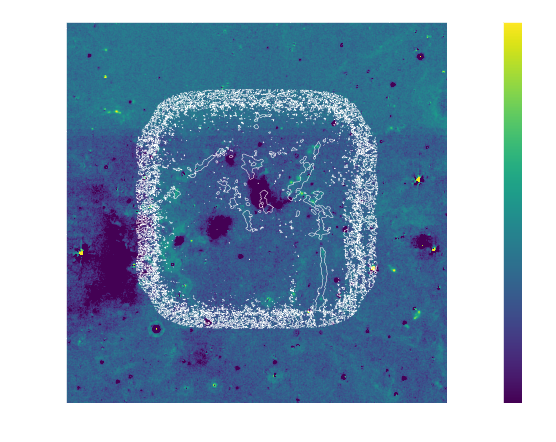

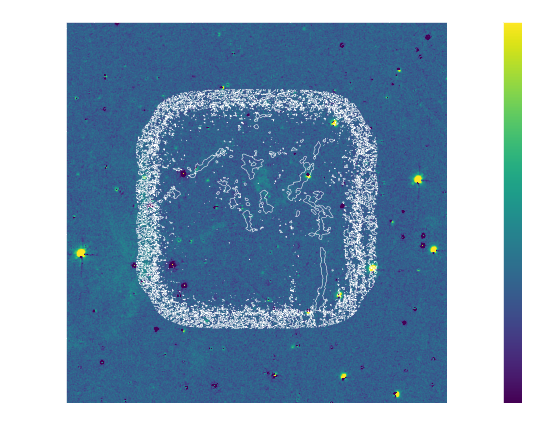

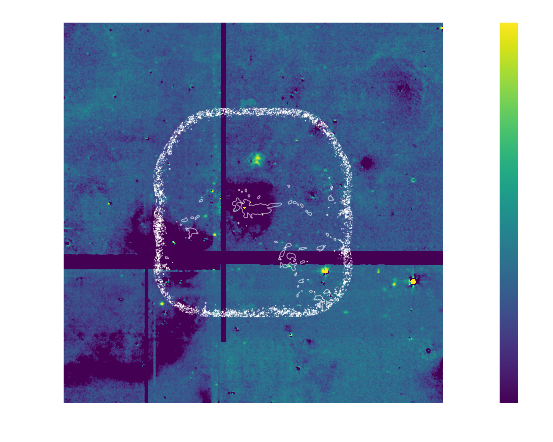

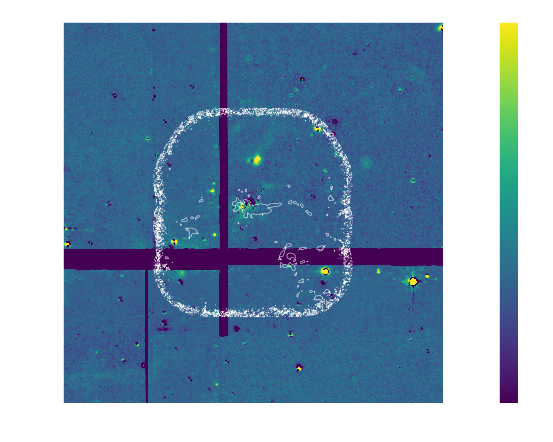

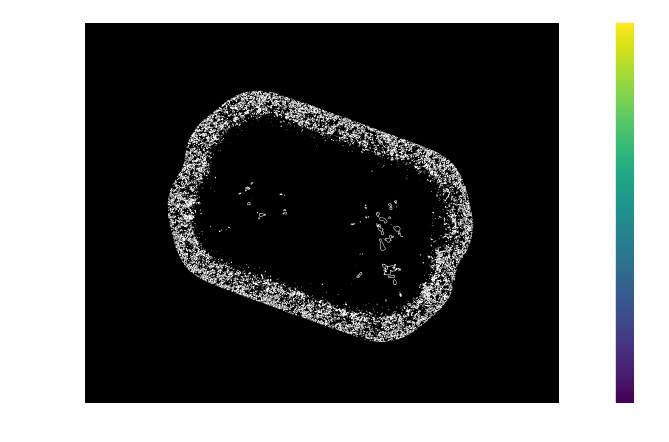

...

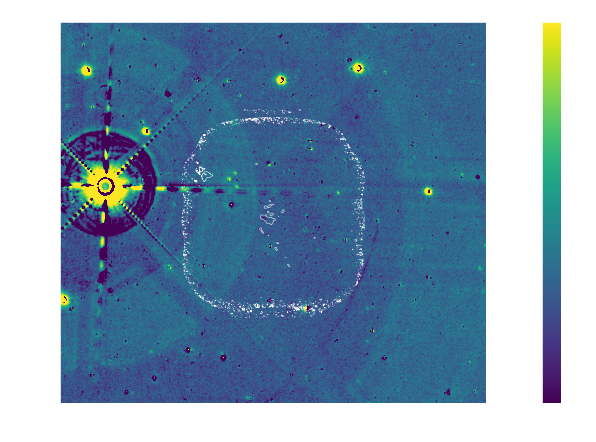

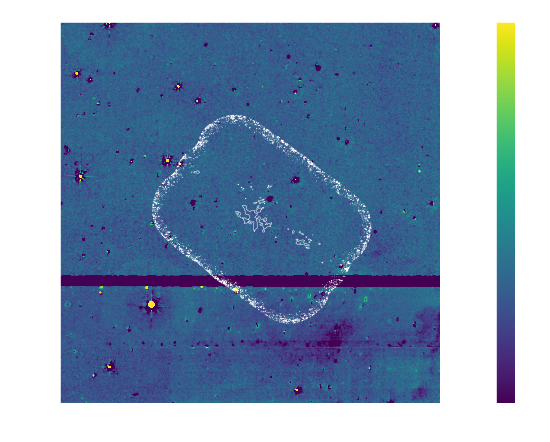

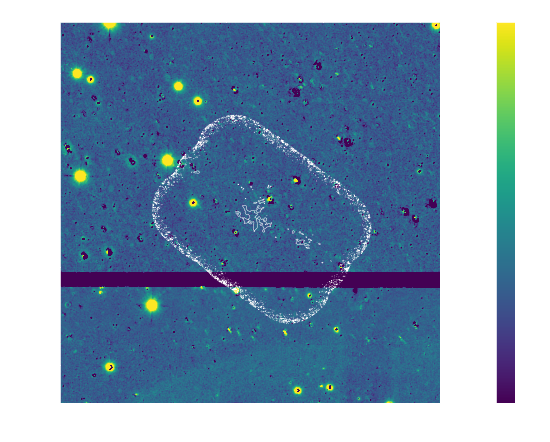

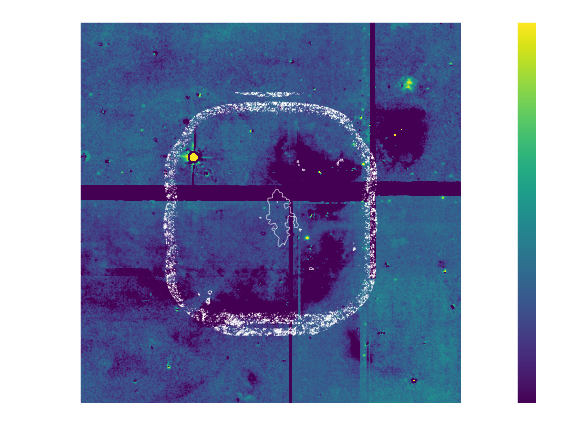

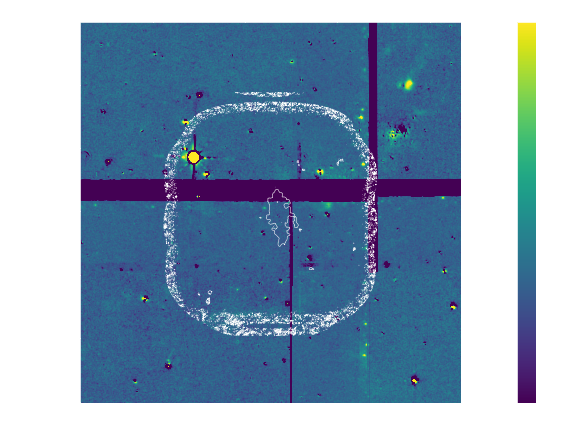

In [103]:
basepath_alma = '/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/imaging_results/moments'
for field in wcses:
    for filtername in filters:
        fn = f'{basepath}/mosaics/{field}_{filtername}_mosaic.fits'
        
        fieldname = prefixes[field]['finaliter_prefix_b3'].split("/")[0]
        
        siofn = f'{basepath_alma}/{fieldname}/{fieldname}_B6_spw1_12M_spw1.JvM.image.pbcor.fits.sio.m0.fits'
        
        if os.path.exists(fn) and os.path.exists(siofn):
            print(f"FOUND files for {field} + {filtername}!")

            fh = fits.open(fn)
            sio = fits.open(siofn)

            fig = pl.figure(figsize=(20,7))
            ax = fig.add_subplot(111, projection=wcs.WCS(fh[0].header))
            im = ax.imshow(fh[0].data, norm=visualization.simple_norm(fh[0].data, stretch='asinh', min_cut=-50, max_cut=400))
            pl.colorbar(mappable=im)
            cn = ax.contour(sio[0].data, transform=ax.get_transform(wcs.WCS(sio[0].header)), levels=[0.17], colors=['w'], linewidths=[0.5])
            ax.coords[0].set_axislabel('RA')
            ax.coords[1].set_axislabel('Dec')
            #ax.coords[0].set_major_formatter('d.dd')
            #ax.coords[1].set_major_formatter('d.dd')
            #ax.coords[0].set_ticks(spacing=5*u.arcmin)
            ##ax.coords[0].set_ticklabel(rotation=45, pad=20)
            ax.set_title(f'{field}: {filtername} with SiO')

            fig.savefig(f'{basepath}/mosaics/{field}_{filtername}_mosaic_ALMA_SiO.png', bbox_inches='tight')
        else:
            print(f'Skipped field {field} with filter {filtername}.  SiO:{os.path.exists(siofn)}  {filtername}:{os.path.exists(fn)}')